## Similar images experiment

This notebook explores the set up of the second version of the reference game experiment wherein the agents have to communicate about pairs of images which are similar. That is, the pretrained speaker will be finetuned on images which depict (mostly) the same categories in both images. The goal of this experiment is to see if the speaker model is capable of varying the degree of necessary description granularity / specifiicity and length, compared to the experiment where random pairs of images are used.

In [148]:
import torch
import torchvision
from torchvision import datasets as dset
from torchvision import transforms as transforms
import torch.nn as nn
import torchvision.models as models
from torch.utils.data import Dataset, DataLoader
import os
import json
from random import shuffle
from pycocotools.coco import COCO
from PIL import Image
import matplotlib.pyplot as plt
import pickle
from collections import Counter
from torchtext.data import get_tokenizer
import numpy as np
import math
import time
import sys
import re
import pandas as pd
from tqdm import tqdm

In [144]:
# the thing that needs to be adjusted is the sampling of the items, i.e., 
# the get_func_train_indices method and the __getitem__ method
class Vocabulary(object):

    def __init__(self,
        vocab_threshold,
        vocab_file='../../data/vocab.pkl',
        start_word="START",
        end_word="END",
        unk_word="UNK",         
        annotations_file="../../data/val/annotation/captions_val2014.json",
        pad_word="PAD",
        vocab_from_file=False,
        from_pretrained=False,
        ):
        """
        Initialize the vocabulary object.
        
        Args:
        -----
            vocab_threshold: Minimum word count threshold.
            vocab_file: File containing the vocabulary.
            start_word: Special word denoting sentence start.
            end_word: Special word denoting sentence end.
            unk_word: Special word denoting unknown words.
            annotations_file: Path for train/val annotation file.
            vocab_from_file: If False, create vocab from scratch & override any existing vocab_file
                            If True, load vocab from from existing vocab_file, if it exists
            from_pretrained: If True, use pretrained embeddings. If False, train embeddings from stractch.
        """
        self.vocab_threshold = vocab_threshold
        self.vocab_file = vocab_file
        self.start_word = start_word
        self.end_word = end_word
        self.unk_word = unk_word
        self.pad_word = pad_word
        self.annotations_file = annotations_file
        self.vocab_from_file = vocab_from_file
        self.from_pretrained = from_pretrained
        if from_pretrained:
            _fasttext_path = "~/gensim-data/fasttext-wiki-news-subwords-300/fasttext-wiki-news-subwords-300.gz"
            self._fasttext = gensim.models.KeyedVectors.load_word2vec_format(_fasttext_path)
        
        self.get_vocab()

    def get_vocab(self):
        """
        Load the vocabulary from file OR build the vocabulary from scratch.
        Assign word2idx and idx2word mappings.
        If vocabulary built from scratch, write out to pickle file.
        """

        if os.path.exists(self.vocab_file) & self.vocab_from_file:
            with open(self.vocab_file, 'rb') as f:
                vocab = pickle.load(f)
                self.word2idx = vocab.word2idx
                self.idx2word = vocab.idx2word
            print('Vocabulary successfully loaded from vocab.pkl file!')
        else:
            self.build_vocab()
            with open(self.vocab_file, 'wb') as f:
                pickle.dump(self, f)
        
    def build_vocab(self):
        """
        Populate the dictionaries for converting tokens to integers (and vice-versa).
        """
        self.init_vocab()

        # only add caption words if the vocab needs to be built from the dataset  
        if not self.from_pretrained:
            self.add_word(self.start_word)
            self.add_word(self.end_word)
            self.add_word(self.unk_word)
            self.add_word(self.pad_word)
            self.add_captions()

    def init_vocab(self):
        """
        If building vocab from dataset, initialize the dictionaries for converting tokens to integers (and vice-versa).
        If using a pretrained vocabulary, set the mappings to retrieved dictionaries.
        """
        if self.from_pretrained:
            self.word2idx = self._fasttext.key_to_index
            self.idx2word = dict(zip(np.arange(len(self._fasttext.index_to_key)), self._fasttext.index_to_key)) 
        else:
            self.word2idx = {} 
            self.idx2word = {}
            self.idx = 0

    def add_word(self, word):
        """
        Add a token to the vocabulary.

        Args:
        ----
            word: str
                Word to be added to the vocabulary.
        """
        if not word in self.word2idx:
            self.word2idx[word] = self.idx
            self.idx2word[self.idx] = word
            self.idx += 1

    def add_captions(self):
        """
        Loop over training captions and add all tokens to the vocabulary that meet or exceed the threshold.
        Used if vocab is built from data.
        """
        coco = COCO(self.annotations_file)
        counter = Counter()
        ids = coco.anns.keys()
        tokenizer = get_tokenizer("basic_english")
        for i, id in enumerate(ids):
            caption = str(coco.anns[id]['caption'])
            caption = caption.lower().strip()
            caption = re.sub(r"[^a-zA-Z.,!?]+", r" ", caption)
            tokens = tokenizer(caption) 
            counter.update(tokens)

            if i % 100000 == 0:
                print("[%d/%d] Tokenizing captions..." % (i, len(ids)))

        words = [word for word, cnt in counter.items() if cnt >= self.vocab_threshold]

        for i, word in enumerate(words):
            self.add_word(word)

    def __call__(self, word):
        """
        Returns index of word, when calling voab(word) on instantiated Vocabulary object.

        Args:
        -----
            word: str
                Word for which the index is returned.
        Returns: int
            Index of word        
        """
        if not word in self.word2idx:
            return self.word2idx[self.unk_word]
        return self.word2idx[word]

    def __len__(self):
        """
        Returns number of unique vocabulary tokens.
        """
        return len(self.word2idx)

In [204]:
class COCOCaptionsDataset(Dataset):
    """
    Custom class for preprocessing datapoints and sampling a random caption per image.
    """
    def __init__(
            self, 
            file, 
            download_dir, 
            img_transform, 
            text_transform, 
            batch_size, 
            mode, 
            vocab_threshold, 
            vocab_file, 
            start_token, 
            end_token,
            unk_token,
            pad_token, 
            vocab_from_file, 
            vocab_from_pretrained=False,
            max_sequence_length=0,
            categorize_imgs=False, # flag whether the images need to be sorted
        ):
        self.transform = img_transform
        self.mode = mode # train or test or val
        self.batch_size = batch_size
        self.vocab = Vocabulary(vocab_threshold, vocab_file, 
                                start_token, end_token, unk_token, 
                                file, pad_token, vocab_from_file, vocab_from_pretrained) 
        self.max_sequence_length = max_sequence_length
        self.pad_token=pad_token
        # read categories2img
        with open("../../../data/categories_to_image_IDs_train_filtered.json", "r") as fp:
            f = json.load(fp)
        self.categories2image = f    
        self.category_ids = list(f.keys())
        # read img2categories
        with open("../../../data/imageIDs_to_categories_train_filtered.json", "r") as fp:
            f = json.load(fp)
        self.imgs2cats = f
        
        # read imgID to annIDs mapping file
        with open("imgID2annID.json", "r") as fp:
            f = json.load(fp)
        self.imgID2annID = f
        
        # some distinctions below for Train and test mode
        if mode == "train":
            self.image_dir = os.path.join(download_dir, "train2014") # download_dir needs to be data/train/ then 
            self.coco = COCO(file) # os.path.join(download_dir, file)
            _ids = list(self.coco.anns.keys())
            shuffle(_ids)
            # retrieve a subset of images for pretraining
            self.ids = list(self.coco.anns.keys()) #torch.load("pretrain_img_IDs_2imgs.pt").tolist()#_ids[:70000]
            # set the image IDs for validation during early stopping to avoid overlapping images
#             self.ids_val = torch.load("pretrain_val_img_IDs_2imgs.pt").tolist() #_ids[70000:73700]
            print('Obtaining caption lengths...')
            tokenizer = get_tokenizer("basic_english") # nltk.tokenize.word_tokenize(str(self.coco.anns[self.ids[index]]['caption']).lower())
            all_tokens = [tokenizer(str(self.coco.anns[self.ids[index]]['caption']).lower()) for index in tqdm(np.arange(len(self.ids)))] 
#             all_tokens_val = [tokenizer(str(self.coco.anns[self.ids_val[index]]['caption']).lower()) for index in tqdm(np.arange(len(self.ids_val)))] 
            self.caption_lengths = [len(token) for token in all_tokens]
#             self.caption_lengths_val = [len(token) for token in all_tokens_val] 
            # print pretraining IDs for later separation from functional training
            # save used indices to torch file
#             torch.save(torch.tensor(self.ids), "pretrain_img_IDs_2imgs_1024dim.pt")
#             torch.save(torch.tensor(self.ids_val), "pretrain_val_img_IDs_2imgs_1024dim.pt")

        elif mode == "val":
            self.image_dir = os.path.join(download_dir, "val2014")
            self.coco = COCO(file) # os.path.join(download_dir, file)
            self.ids = list(self.coco.anns.keys())#[:1000]
            print('Obtaining caption lengths...')
            tokenizer = get_tokenizer("basic_english") # nltk.tokenize.word_tokenize(str(self.coco.anns[self.ids[index]]['caption']).lower())
            all_tokens = [tokenizer(str(self.coco.anns[self.ids[index]]['caption']).lower()) for index in tqdm(np.arange(len(self.ids)))] 
            self.caption_lengths = [len(token) for token in all_tokens]
            
        else:
            # no annotations here 
            test_info = json.loads(open(file).read()) # os.path.join(download_dir, file)
            self.paths = [item['file_name'] for item in test_info['images']]
    
    def __len__(self):
        if self.mode != "test":
            return len(self.ids) 
        else:
            return len(self.paths)
    
    def __getitem__(self, idx):
        """
        Return an image-caption tuple. A random caption per images is chosen since the dataset maps captions onto images.
        
        Arguments:
        -------
        idx: int
            Index of the item to be returned.
        Returns:
        -----
        image: torch.tensor((3,224,224))
        caption: torch.tensor((len_caption))
        """
        
        # obtain image and caption if in training mode
        if self.mode != 'test':
            # get target and distractor indices
#             target_idx = idx[0]
#             distractor_idx = idx[1]
            
            img_id = idx[0] #self.ids[target_idx]
            ann_id = np.random.choice(self.imgID2annID[str(img_id)]).item()
            print("target ann id: ", ann_id)
            target_caption = self.coco.anns[ann_id]['caption']
            img_id = self.coco.anns[ann_id]['image_id']
            target_path = self.coco.loadImgs(img_id)[0]['file_name']

            # get distarctor
            dist_img_id = idx[1] #self.ids[distractor_idx]
            dist_id = np.random.choice(self.imgID2annID[str(dist_img_id)]).item()
            
            dist_img_id = self.coco.anns[dist_id]['image_id']
            distractor_path = self.coco.loadImgs(dist_img_id)[0]['file_name']

            # Convert image to tensor and pre-process using transform
            target_image = Image.open(os.path.join(self.image_dir, target_path)).convert('RGB')
            target_image = self.transform(target_image)

            distractor_image = Image.open(os.path.join(self.image_dir, distractor_path)).convert('RGB')
            distractor_image = self.transform(distractor_image)

            tokenizer = get_tokenizer("basic_english")
            tokens = tokenizer(str(target_caption).lower())
            # Convert caption to tensor of word ids, append start and end tokens.
            target_caption = []
            target_caption.append(self.vocab(self.vocab.start_word))

            # check if the sequence needs to be padded or truncated
            if self.max_sequence_length != 0:
                tokens = tokens[:self.max_sequence_length]

            target_caption.extend([self.vocab(token) for token in tokens])
            target_caption.append(self.vocab(self.vocab.end_word))
            target_caption = torch.Tensor(target_caption).long()
            return target_image, distractor_image, target_caption

        # obtain image if in test mode
        else:
            path = self.paths[idx]

            # Convert image to tensor and pre-process using transform
            PIL_image = Image.open(os.path.join(self.image_dir, path)).convert('RGB')
            orig_image = np.array(PIL_image)
            image = self.transform(PIL_image)
            # return original image and pre-processed image tensor
            return orig_image, image
        

    def get_func_similar_train_indices(self):
        """
        Simple POC function returning two lists on indices for the functional training. 
        Returns a list of inidces for targets and a list f indices for distractors. 
        Captions are of same lengths for targets and distractors (will be optimized).
        
        Returns:
        -------
            list: (int, int)
                List of tuples of target and distractor indices, each for a single reference game iteration.
        """
        
#         sel_length_t = np.random.choice(self.caption_lengths)

        # select at random a category of interest
        # the idea is to have by-batch catrgorization
        sel_category = np.random.choice(self.category_ids)
        all_indices_cat = self.categories2image[sel_category]
        # sample a batch, create tuples
        indices_t = list(np.random.choice(all_indices_cat, size=self.batch_size))
        possible_inds_dist = [x for x in all_indices_cat if x not in indices_t]
        indices_d = list(np.random.choice(possible_inds_dist, size=self.batch_size))
        inds_tuples = list(zip(indices_t, indices_d))
        # check that for each pair, the categories overlap between target and distractor matches my criteria
        for tup in inds_tuples:
            common_cats = list(set.intersection(set(self.imgs2cats[str(tup[0])]['categories']), set(self.imgs2cats[str(tup[1])]['categories'])))
            print("common cats before while: ", common_cats)
            print("Len common cats: ", len(common_cats))
            print("target cats: ", set(self.imgs2cats[str(tup[0])]['categories']))
            print("Len ", len(set(self.imgs2cats[str(tup[0])]['categories'])))
            print("dist cats: ", set(self.imgs2cats[str(tup[1])]['categories']))
            while len(common_cats) < 3 and len(common_cats) != len(self.imgs2cats[str(tup[0])]['categories']):
                print("common cats in while: ", common_cats)
                tup = tuple([tup[0], np.random.choice(possible_inds_dist, size=1).item()])
                common_cats = list(set.intersection(set(self.imgs2cats[str(tup[0])]['categories']), set(self.imgs2cats[str(tup[1])]['categories'])))
                # sample a new target dist pair
                
#         all_indices_t = np.where([self.caption_lengths[i] == sel_length_t for i in np.arange(len(self.caption_lengths))])[0]

#         indices_t = list(np.random.choice(all_indices_t, size=self.batch_size))
#         possible_inds_dist = [x for x in np.arange(len(self.caption_lengths)) if x not in indices_t]
#         indices_d = list(np.random.choice(possible_inds_dist, size=self.batch_size))
        
        return inds_tuples#list(zip(indices_t, indices_d))


In [ ]:
def _sort_images_by_category(download_dir, filename, is_train):
    """
    Sort image filenames into a dictionary with supercategory IDs as keys.

    Arguments:
    --------
        filename: str (instances file)
            Path to file containing image filenames and category annotations
    Returns:
    ------
        categories: dict
            Dict of form {category_id : [image file names] }
    """
    # check if json file with this info laready exists, otherwise export
    if os.path.exists("../../data/categories_to_image_paths.json"):
        print("Category to image IDs json file already exists!")
        # read existing file
        with open("../../data/categories_to_image_paths.json", "r", encoding="utf-8") as fp:
            categories = json.load(fp)
        return categories
    else:    
        # load instances file
        if is_train:
            path = os.path.join(download_dir, "annotations", "".join([filename, "_train2014.json"]))
        else: 
            path = os.path.join(download_dir, "annotations", "".join([filename, "_val2014.json"]))  

        # Load the json file.
        with open(path, "r", encoding="utf-8") as file:
            categories_raw = json.load(file)
            print("Loading categories for ", path)
    
        # load annotations section
        # TODO check how to map IDs to names elsewhere
        # category_names_ids = [(cat["id"], cat["name"]) for cat in categories_raw["categories"]]
        category_ids = [cat["id"] for cat in categories_raw["categories"]]
        print("List of category IDs: ", category_ids)
        # create empty dict for records
        categories = dict()
        # create dictinary with all the keys
        for i in category_ids:
            categories[i] = list()
        # build helper image dictionary with image IDs as keys
        images_raw = categories_raw["images"]
        image_dict = dict()
        for image in images_raw:
            image_dict[image["id"]] = image 

        # assign image filenames to the category keys
        # get image IDs from annotation entries
        annotation_ids = categories_raw["annotations"] 
        print("Number of records: ", len(annotation_ids))  
        for ann in annotation_ids:
            # get the image id of the entry
            image = ann["image_id"]
#             print(str(image))
            if str(image) in img_bad_IDs:
                continue
            else:
                # get the category id of the entry
                category = ann["category_id"]
                image_path = image_dict[image]["file_name"]
                # append image id to respective category
                categories[category].append(image)
            
        print("Dumping json ...")

        with open("../../../data/categories_to_image_IDs_train_filtered.json", "w") as fp:
            json.dump(categories, fp)

        return categories    

def _get_image_categories(download_dir, is_train):
    """
    Function mapping each image ID to all category annotations.
    """
    # check is file already exists
    if os.path.exists("../../data/imageIDs_to_categories.json"):
        print("Image IDs to category IDs json file already exists!")
        # read existing file
        with open("../../data/imageIDs_to_categories.json", "r", encoding="utf-8") as fp:
            images = json.load(fp)
        return images
    else:  
        if is_train: 
            file_path = os.path.join(download_dir, "annotations", "instances_train2014.json")
        else:
            file_path = os.path.join(download_dir, "annotations", "instances_val2014.json")    
        # load annotations file
        with open(file_path) as f:
            categories = json.load(f)
        # load categories to supercategories mapping file
        with open("../../../data/categories_to_supercategories.json", "r") as cats:
            supercats = json.load(cats)    
        # create dictionary with image ids as keys
        images = dict()
        images_raw = categories["images"]
        for image in images_raw:
            images[image["id"]] = dict()
            images[image["id"]]["categories"] = list()
            images[image["id"]]["supercategories"] = list()
            
        for ann in categories["annotations"]:
            # check if category already included
            if ann["category_id"] in images[ann["image_id"]]["categories"]:
                pass
            else:
                images[ann["image_id"]]["categories"].append(ann["category_id"])
            # add supercategories
            supercat = supercats[str(ann["category_id"])]
            if supercat in images[ann["image_id"]]["supercategories"]:
                pass
            else:
                images[ann["image_id"]]["supercategories"].append(supercat)
            # check if the image is too crowded to be used in the within-category training
            if len(images[ann["image_id"]]["categories"]) > 6:
                images[ann["image_id"]]["has_many_categories"] = True 
            else:
                images[ann["image_id"]]["has_many_categories"] = False 

        # write out json
        with open("../../../data/imageIDs_to_categories_train.json", "w") as fp:
            json.dump(images, fp)
        return images
        

In [132]:
# _sort_images_by_category(
#         download_dir="../../../data/train/",
#         filename="instances",
#         is_train=True,
# )

Loading categories for  ../../../data/train/annotations/instances_train2014.json
List of category IDs:  [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 27, 28, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 67, 70, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 84, 85, 86, 87, 88, 89, 90]
Number of records:  604907
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
H

HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT


HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT


HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT


HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT


HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT


HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT


HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT


HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT


HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT


HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT


HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT


HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT


HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT


HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT


HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT


HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT


HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT


HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT


HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT


HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT


HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT


HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT


HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT


HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT


HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT


HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT


HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT


HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT


HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT


HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT


HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT


HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT


HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT


HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT


HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT


HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT


HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT
HIT


{1: [196842,
  44474,
  382669,
  188163,
  420049,
  466093,
  134378,
  270369,
  304134,
  203124,
  469495,
  515186,
  527216,
  327395,
  148540,
  529952,
  436038,
  570874,
  213214,
  323125,
  4219,
  437562,
  174217,
  355668,
  225331,
  276017,
  530286,
  399556,
  188482,
  481736,
  538250,
  355156,
  557648,
  252801,
  314257,
  126906,
  47084,
  24215,
  388135,
  339690,
  7710,
  574052,
  290305,
  66082,
  308103,
  391561,
  278656,
  2639,
  580286,
  302236,
  100563,
  41771,
  134644,
  495312,
  513657,
  302538,
  466223,
  139932,
  557272,
  226162,
  210751,
  174229,
  127586,
  417476,
  467753,
  433398,
  503536,
  312233,
  316759,
  324677,
  308475,
  301187,
  470474,
  148427,
  47405,
  509553,
  111543,
  526734,
  334708,
  497384,
  419297,
  496517,
  54995,
  199225,
  358429,
  37695,
  109823,
  526861,
  81589,
  271441,
  5256,
  557272,
  21222,
  518108,
  80554,
  329276,
  119822,
  147082,
  61260,
  538709,
  329469,
  47969

In [186]:
def get_loader(transform,
               mode='val',
               batch_size=1,
               vocab_threshold=None,
               vocab_file='./vocab.pkl',
               start_word="START",
               end_word="END",
               unk_word="UNK",
               pad_word="PAD",
               vocab_from_file=True,
               num_workers=0,
               download_dir="../../../data/val/",
               vocab_from_pretrained=False,
               categorize_imgs=False,
              ):
    """Returns the data loader.
    Args:
      transform: Image transform.
      mode: One of 'train' or 'test'.
      batch_size: Batch size (if in testing mode, must have batch_size=1).
      vocab_threshold: Minimum word count threshold.
      vocab_file: File containing the vocabulary. 
      start_word: Special word denoting sentence start.
      end_word: Special word denoting sentence end.
      unk_word: Special word denoting unknown words.
      vocab_from_file: If False, create vocab from scratch & override any existing vocab_file.
                       If True, load vocab from from existing vocab_file, if it exists.
      num_workers: Number of subprocesses to use for data loading 
      cocoapi_loc: The location of the folder containing the COCO API: https://github.com/cocodataset/cocoapi
    """
    
    assert mode in ['train', 'test', 'val'], "mode must be one of 'train' or 'test'."
    
    if vocab_from_file==False: assert mode=='train' or mode=='val', "To generate vocab from captions file, must be in training mode (mode='train')."

    # Based on mode (train, val, test), obtain img_folder and annotations_file.
    if mode == 'val':
        if vocab_from_file==True: assert os.path.exists(vocab_file), "vocab_file does not exist.  Change vocab_from_file to False to create vocab_file."
        img_folder = os.path.join(download_dir, "val2014/") 
        annotations_file = os.path.join(download_dir, 'annotations/captions_val2014.json')
    if mode == 'train':
        if vocab_from_file==True: assert os.path.exists(vocab_file), "vocab_file does not exist.  Change vocab_from_file to False to create vocab_file."
        img_folder = os.path.join(download_dir, "train2014/") 
        annotations_file = os.path.join(download_dir, 'annotations/captions_train2014.json')
    if mode == 'test':
        assert batch_size==1, "Please change batch_size to 1 if testing your model."
        assert os.path.exists(vocab_file), "Must first generate vocab.pkl from training data."
        assert vocab_from_file==True, "Change vocab_from_file to True."
        img_folder = os.path.join(download_dir, "val2014/") #'test2014/'
        annotations_file = os.path.join(download_dir, 'annotations/captions_val2014.json') #image_info_test2014

    # TODO: alternatively, modify / sort the image IDS on the instantiated dataset.ids object 
    # COCO caption dataset.
    dataset = COCOCaptionsDataset(
        file=annotations_file,
        download_dir = download_dir, 
        img_transform=transform,
        text_transform=None,
        batch_size=batch_size,
        mode=mode,
        vocab_threshold=vocab_threshold,
        vocab_file=vocab_file,
        start_token=start_word,
        end_token=end_word,
        unk_token=unk_word,
        pad_token=pad_word,
        vocab_from_file=vocab_from_file,
        vocab_from_pretrained=vocab_from_pretrained,
        max_sequence_length=15,
        categorize_imgs=categorize_imgs,
    )
    

    if mode == 'train':
        # Randomly sample a caption length, and sample indices with that length.
        indices = dataset.get_func_similar_train_indices()
        # Create and assign a batch sampler to retrieve a batch with the sampled indices.
        initial_sampler = torch.utils.data.sampler.SubsetRandomSampler(indices=indices)
        # data loader for COCO dataset.
        data_loader = torch.utils.data.DataLoader(
            dataset=dataset, 
            num_workers=num_workers,
            batch_sampler=torch.utils.data.sampler.BatchSampler(sampler=initial_sampler,
                                                                batch_size=dataset.batch_size,
                                                                drop_last=False))
    elif mode == 'val':
        # Randomly sample a caption length, and sample indices with that length.
        indices = dataset.get_func_similar_train_indices()
        # Create and assign a batch sampler to retrieve a batch with the sampled indices.
        initial_sampler = torch.utils.data.sampler.SubsetRandomSampler(indices=indices)
        # data loader for COCO dataset.
        data_loader = torch.utils.data.DataLoader(
            dataset=dataset, 
            num_workers=num_workers,
            batch_sampler=torch.utils.data.sampler.BatchSampler(sampler=initial_sampler,
                                                                batch_size=dataset.batch_size,
                                                                drop_last=False))
    else:
        data_loader = torch.utils.data.DataLoader(
            dataset=dataset,               
            batch_size=dataset.batch_size,
            shuffle=True,
            num_workers=num_workers,
        )

    return data_loader

In [205]:
# try the new index sampling function
transform_train = transforms.Compose([ 
    transforms.Resize(256),                          # smaller edge of image resized to 256
    transforms.RandomCrop(224),                      # get 224x224 crop from random location
    transforms.RandomHorizontalFlip(),               # horizontally flip image with probability=0.5
    transforms.ToTensor(),                           # convert the PIL Image to a tensor
    transforms.Normalize((0.485, 0.456, 0.406),      # normalize image for pre-trained model
                         (0.229, 0.224, 0.225))])

# Build data loader.
data_loader = get_loader(transform=transform_train,
                         mode='train',
                         batch_size=1,
                         vocab_threshold=93,
                         vocab_from_file=True,
                         download_dir="../../../data/train", 
                        )

Vocabulary successfully loaded from vocab.pkl file!
loading annotations into memory...
Done (t=0.41s)
creating index...
index created!
Obtaining caption lengths...


100%|██████████| 414113/414113 [00:04<00:00, 101912.88it/s]

common cats before while:  [1, 35]
Len common cats:  2
target cats:  {1, 35}
Len  2
dist cats:  {1, 35, 36}


In [217]:
indices = data_loader.dataset.get_func_similar_train_indices()
print(indices)

common cats before while:  [1, 41]
Len common cats:  2
target cats:  {41, 1}
Len  2
dist cats:  {1, 41}
[(510500, 556624)]


In [196]:
# now the issue is that the indices returned here are the actual image IDs, while the main indexing in the DS object happens by annotation ID
# there is no way to know which annotations belong to which img ID wihtout creating an explicit mapping
imgID2annID = {}
annotations = data_loader.dataset.coco.anns 
# create emoty lists for the annotations
for i in data_loader.dataset.coco.imgs:
    imgID2annID[i] = list()
# assign annotation IDs    
for ann in annotations:
    img_id = annotations[ann]["image_id"]
    imgID2annID[img_id].append(ann)
    

In [199]:
len(imgID2annID)
# with open("imgID2annID.json", "w") as fp:
#     json.dump(imgID2annID, fp)

In [209]:
def clean_sentence(output):
    """
    Transform list of indices to a sentence.
    """
    list_string = []
    
    for idx in output:
#         print(idx)
        for i in idx:
            list_string.append(data_loader.dataset.vocab.idx2word[i.item()])
    
    list_string = list_string[:-1] # Discard <start> and <end> words
    sentence = ' '.join(list_string) # Convert list of string to full string
    sentence = sentence.capitalize()  # Capitalize the first letter of the first word
    return sentence

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


target ann id:  398204


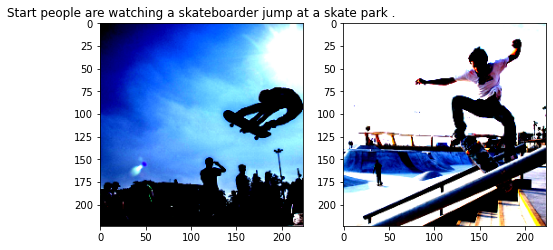

In [218]:
new_sampler = torch.utils.data.sampler.SubsetRandomSampler(indices=indices)
data_loader.batch_sampler.sampler = new_sampler
        
# Obtain the batch.
targets, distractors, target_captions = next(iter(data_loader))

# plot

fig = plt.figure(figsize=(8, 8))
columns = 2
rows = 1

fig.add_subplot(1, 2, 1)
plt.imshow(targets[0].squeeze(0).permute(1,2,0))
plt.title(clean_sentence(target_captions))
fig.add_subplot(1, 2, 2)
plt.imshow(distractors[0].squeeze(0).permute(1,2,0))

plt.show()

# plt.imshow(targets[0].squeeze(0).permute(1,2,0))
# plt.title(clean_sentence(target_captions))
#     plt.imshow(dist_image[0].squeeze(0).permute(1,2,0))
#     plt.title("Distractor")
    
# plt.show()

In [187]:
data_loader_val = get_loader(transform=transform_train,
                         mode='val',
                         batch_size=1,
                         vocab_threshold=93,
                         vocab_from_file=True,
                         download_dir="../../../data/val", 
                        )
list(data_loader_val.dataset.coco.anns.keys()).index(15073)

Vocabulary successfully loaded from vocab.pkl file!
loading annotations into memory...
Done (t=0.21s)
creating index...
index created!
Obtaining caption lengths...


100%|██████████| 202654/202654 [00:02<00:00, 78174.22it/s] 


common cats before while:  [33, 1]
Len common cats:  2
target cats:  {33, 27, 1}
Len  3
dist cats:  {1, 33, 4, 43, 44}
common cats in while:  [33, 1]
common cats in while:  [33]
common cats in while:  [33, 1]
common cats in while:  [1, 33]
common cats in while:  [33]
common cats in while:  [33]
common cats in while:  [1, 33]
common cats in while:  [33]


ValueError: 15073 is not in list

In [194]:
data_loader.dataset.coco.anns

{48: {'image_id': 318556,
  'id': 48,
  'caption': 'A very clean and well decorated empty bathroom'},
 67: {'image_id': 116100,
  'id': 67,
  'caption': 'A panoramic view of a kitchen and all of its appliances.'},
 126: {'image_id': 318556,
  'id': 126,
  'caption': 'A blue and white bathroom with butterfly themed wall tiles.'},
 148: {'image_id': 116100,
  'id': 148,
  'caption': 'A panoramic photo of a kitchen and dining room'},
 173: {'image_id': 379340,
  'id': 173,
  'caption': 'A graffiti-ed stop sign across the street from a red car '},
 188: {'image_id': 379340,
  'id': 188,
  'caption': 'A vandalized stop sign and a red beetle on the road'},
 219: {'image_id': 318556,
  'id': 219,
  'caption': 'A bathroom with a border of butterflies and blue paint on the walls above it.'},
 255: {'image_id': 318556,
  'id': 255,
  'caption': 'An angled view of a beautifully decorated bathroom.'},
 272: {'image_id': 134754,
  'id': 272,
  'caption': 'The two people are walking down the beach.'

In [114]:
# look at the category2image assignments i created
with open("../../../data/categories_to_image_IDs_train.json", "r") as fp:
    f = json.load(fp)

In [122]:
len(f['2'])

4955

In [133]:
# compare to filtered
with open("../../../data/categories_to_image_IDs_train_filtered.json", "r") as fp:
    ff = json.load(fp)
    

In [134]:
len(ff['2'])

4443

In [18]:
# img2cats = _get_image_categories(
#         download_dir="../../../data/train/",
#         is_train=True,
# )

In [75]:
# load file mapping each image to its categories
with open("../../../data/imageIDs_to_categories_train.json", "r") as fp:
    img2cats = json.load(fp)

In [97]:
len(img2cats)

82783

In [89]:
# filter those IDs / items which DO NOT have too many categories
img2cats_few_cats = []
for x in list(img2cats.items()):
    print(x)
    try:
        if x[1]['has_many_categories'] == False:
            img2cats_few_cats.append(x)
    except KeyError:
        continue

('57870', {'categories': [62, 67, 86, 64, 84], 'supercategories': ['furniture', 'indoor'], 'has_many_categories': False})
('384029', {'categories': [1, 61, 60], 'supercategories': ['person', 'food'], 'has_many_categories': False})
('222016', {'categories': [1], 'supercategories': ['person'], 'has_many_categories': False})
('520950', {'categories': [47, 50, 79, 44, 49], 'supercategories': ['kitchen', 'appliance'], 'has_many_categories': False})
('69675', {'categories': [47, 80, 1, 46, 79, 50], 'supercategories': ['kitchen', 'appliance', 'person'], 'has_many_categories': False})
('547471', {'categories': [32, 1, 62], 'supercategories': ['accessory', 'person', 'furniture'], 'has_many_categories': False})
('122688', {'categories': [62, 67, 85, 84, 86], 'supercategories': ['furniture', 'indoor'], 'has_many_categories': False})
('392136', {'categories': [6, 1, 3, 27], 'supercategories': ['vehicle', 'person', 'accessory'], 'has_many_categories': False})
('398494', {'categories': [44, 2, 51, 8

('63050', {'categories': [3, 15], 'supercategories': ['vehicle', 'outdoor'], 'has_many_categories': False})
('480890', {'categories': [64, 1, 15, 31], 'supercategories': ['furniture', 'person', 'outdoor', 'accessory'], 'has_many_categories': False})
('320722', {'categories': [19, 21, 20], 'supercategories': ['animal'], 'has_many_categories': False})
('521732', {'categories': [15, 3], 'supercategories': ['outdoor', 'vehicle'], 'has_many_categories': False})
('330915', {'categories': [6], 'supercategories': ['vehicle'], 'has_many_categories': False})
('178550', {'categories': [3, 11, 64], 'supercategories': ['vehicle', 'outdoor', 'furniture'], 'has_many_categories': False})
('254562', {'categories': [1, 11, 15, 27], 'supercategories': ['person', 'outdoor', 'accessory'], 'has_many_categories': False})
('555296', {'categories': [11], 'supercategories': ['outdoor'], 'has_many_categories': False})
('11856', {'categories': [1, 15, 31, 56], 'supercategories': ['person', 'outdoor', 'accessory',

('480739', {'categories': [70], 'supercategories': ['furniture'], 'has_many_categories': False})
('228984', {'categories': [70], 'supercategories': ['furniture'], 'has_many_categories': False})
('458430', {'categories': [4], 'supercategories': ['vehicle'], 'has_many_categories': False})
('629', {'categories': [4], 'supercategories': ['vehicle'], 'has_many_categories': False})
('136732', {'categories': [4, 1], 'supercategories': ['vehicle', 'person'], 'has_many_categories': False})
('553587', {'categories': [4], 'supercategories': ['vehicle'], 'has_many_categories': False})
('106704', {'categories': [4, 1], 'supercategories': ['vehicle', 'person'], 'has_many_categories': False})
('153730', {'categories': [4, 1], 'supercategories': ['vehicle', 'person'], 'has_many_categories': False})
('161190', {'categories': [72, 1, 73, 74, 76, 47, 77], 'supercategories': ['electronic', 'person', 'kitchen'], 'has_many_categories': True})
('18402', {'categories': [77, 31, 1, 27], 'supercategories': ['el

('341503', {'categories': [3, 8, 1], 'supercategories': ['vehicle', 'person'], 'has_many_categories': False})
('144814', {'categories': [8, 3, 6], 'supercategories': ['vehicle'], 'has_many_categories': False})
('95879', {'categories': [8, 3, 6], 'supercategories': ['vehicle'], 'has_many_categories': False})
('362555', {'categories': [8, 3], 'supercategories': ['vehicle'], 'has_many_categories': False})
('581189', {'categories': [3, 4, 1, 10], 'supercategories': ['vehicle', 'person', 'outdoor'], 'has_many_categories': False})
('310289', {'categories': [1, 60, 82, 44], 'supercategories': ['person', 'food', 'appliance', 'kitchen'], 'has_many_categories': False})
('38771', {'categories': [70], 'supercategories': ['furniture'], 'has_many_categories': False})
('74409', {'categories': [72, 1, 74, 76, 84, 47, 62], 'supercategories': ['electronic', 'person', 'indoor', 'kitchen', 'furniture'], 'has_many_categories': True})
('185334', {'categories': [4, 1, 31, 15, 77], 'supercategories': ['vehicl

('490959', {'categories': [2, 6], 'supercategories': ['vehicle'], 'has_many_categories': False})
('58406', {'categories': [77, 1], 'supercategories': ['electronic', 'person'], 'has_many_categories': False})
('212786', {'categories': [70], 'supercategories': ['furniture'], 'has_many_categories': False})
('502894', {'categories': [18, 2, 1, 27, 33, 31], 'supercategories': ['animal', 'vehicle', 'person', 'accessory'], 'has_many_categories': False})
('327191', {'categories': [81], 'supercategories': ['appliance'], 'has_many_categories': False})
('502112', {'categories': [64, 17, 44, 47, 70, 81], 'supercategories': ['furniture', 'animal', 'kitchen', 'appliance'], 'has_many_categories': False})
('343933', {'categories': [2, 1], 'supercategories': ['vehicle', 'person'], 'has_many_categories': False})
('285376', {'categories': [70, 17], 'supercategories': ['furniture', 'animal'], 'has_many_categories': False})
('170885', {'categories': [70, 81, 1], 'supercategories': ['furniture', 'appliance',

('371548', {'categories': [48, 49, 67], 'supercategories': ['kitchen', 'furniture'], 'has_many_categories': False})
('237453', {'categories': [48, 49, 47, 67], 'supercategories': ['kitchen', 'furniture'], 'has_many_categories': False})
('86017', {'categories': [67, 46, 47, 49, 1, 51, 57], 'supercategories': ['furniture', 'kitchen', 'person', 'food'], 'has_many_categories': True})
('305141', {'categories': [63, 1, 46], 'supercategories': ['furniture', 'person', 'kitchen'], 'has_many_categories': False})
('245982', {'categories': [62, 67, 1, 46, 50, 48, 49], 'supercategories': ['furniture', 'person', 'kitchen'], 'has_many_categories': True})
('580945', {'categories': [44, 1, 46, 60], 'supercategories': ['kitchen', 'person', 'food'], 'has_many_categories': False})
('528449', {'categories': [64, 1, 46, 44, 62, 67], 'supercategories': ['furniture', 'person', 'kitchen'], 'has_many_categories': False})
('522862', {'categories': [67, 1, 46, 51, 62], 'supercategories': ['furniture', 'person', '

('350879', {'categories': [79], 'supercategories': ['appliance'], 'has_many_categories': False})
('515843', {'categories': [82], 'supercategories': ['appliance'], 'has_many_categories': False})
('96057', {'categories': [82, 81], 'supercategories': ['appliance'], 'has_many_categories': False})
('491305', {'categories': [82, 78, 79], 'supercategories': ['appliance'], 'has_many_categories': False})
('442859', {'categories': [85], 'supercategories': ['indoor'], 'has_many_categories': False})
('115893', {'categories': [72, 85, 62, 47, 1, 76, 73], 'supercategories': ['electronic', 'indoor', 'furniture', 'kitchen', 'person'], 'has_many_categories': True})
('218984', {'categories': [86], 'supercategories': ['indoor'], 'has_many_categories': False})
('79722', {'categories': [84, 88], 'supercategories': ['indoor'], 'has_many_categories': False})
('544457', {'categories': [85, 62, 86, 47], 'supercategories': ['indoor', 'furniture', 'kitchen'], 'has_many_categories': False})
('364656', {'categorie

('15197', {'categories': [72, 73, 74, 76, 75], 'supercategories': ['electronic'], 'has_many_categories': False})
('340611', {'categories': [73, 74, 76, 84, 51, 50, 62], 'supercategories': ['electronic', 'indoor', 'kitchen', 'furniture'], 'has_many_categories': True})
('3259', {'categories': [77, 73, 74, 76, 84, 2, 47, 72, 86], 'supercategories': ['electronic', 'indoor', 'vehicle', 'kitchen'], 'has_many_categories': True})
('385700', {'categories': [62, 73, 74], 'supercategories': ['furniture', 'electronic'], 'has_many_categories': False})
('443490', {'categories': [28, 1, 86], 'supercategories': ['accessory', 'person', 'indoor'], 'has_many_categories': False})
('84651', {'categories': [85], 'supercategories': ['indoor'], 'has_many_categories': False})
('151939', {'categories': [86, 64], 'supercategories': ['indoor', 'furniture'], 'has_many_categories': False})
('549199', {'categories': [44, 62, 67, 73, 1, 63], 'supercategories': ['kitchen', 'furniture', 'electronic', 'person'], 'has_ma

('508092', {'categories': [37, 39, 40, 1], 'supercategories': ['sports', 'person'], 'has_many_categories': False})
('355261', {'categories': [1, 39, 40], 'supercategories': ['person', 'sports'], 'has_many_categories': False})
('121954', {'categories': [1, 39, 40], 'supercategories': ['person', 'sports'], 'has_many_categories': False})
('329684', {'categories': [3, 1, 6, 85, 31], 'supercategories': ['vehicle', 'person', 'indoor', 'accessory'], 'has_many_categories': False})
('62923', {'categories': [85, 1], 'supercategories': ['indoor', 'person'], 'has_many_categories': False})
('487504', {'categories': [16, 1, 85], 'supercategories': ['animal', 'person', 'indoor'], 'has_many_categories': False})
('293233', {'categories': [37, 39, 40, 1], 'supercategories': ['sports', 'person'], 'has_many_categories': False})
('272059', {'categories': [1, 15, 39], 'supercategories': ['person', 'outdoor', 'sports'], 'has_many_categories': False})
('473776', {'categories': [37, 1, 39, 40], 'supercategorie

('327234', {'categories': [42, 1], 'supercategories': ['sports', 'person'], 'has_many_categories': False})
('404108', {'categories': [1, 42], 'supercategories': ['person', 'sports'], 'has_many_categories': False})
('216649', {'categories': [1, 42], 'supercategories': ['person', 'sports'], 'has_many_categories': False})
('325584', {'categories': [65, 85], 'supercategories': ['furniture', 'indoor'], 'has_many_categories': False})
('33476', {'categories': [37, 1, 62], 'supercategories': ['sports', 'person', 'furniture'], 'has_many_categories': False})
('102451', {'categories': [28, 37, 27, 1, 62], 'supercategories': ['accessory', 'sports', 'person', 'furniture'], 'has_many_categories': False})
('547859', {'categories': [1, 3, 6, 37], 'supercategories': ['person', 'vehicle', 'sports'], 'has_many_categories': False})
('326414', {'categories': [84, 65, 1], 'supercategories': ['indoor', 'furniture', 'person'], 'has_many_categories': False})
('466002', {'categories': [65, 84, 1], 'supercategor

('220485', {'categories': [1, 59, 62, 67], 'supercategories': ['person', 'food', 'furniture'], 'has_many_categories': False})
('287794', {'categories': [1, 43], 'supercategories': ['person', 'sports'], 'has_many_categories': False})
('512506', {'categories': [44, 1, 43, 62], 'supercategories': ['kitchen', 'person', 'sports', 'furniture'], 'has_many_categories': False})
('408373', {'categories': [37, 1, 15, 43], 'supercategories': ['sports', 'person', 'outdoor'], 'has_many_categories': False})
('432339', {'categories': [1, 59], 'supercategories': ['person', 'food'], 'has_many_categories': False})
('45524', {'categories': [1, 3, 31, 43], 'supercategories': ['person', 'vehicle', 'accessory', 'sports'], 'has_many_categories': False})
('271396', {'categories': [37, 3, 1, 43, 62], 'supercategories': ['sports', 'vehicle', 'person', 'furniture'], 'has_many_categories': False})
('108439', {'categories': [59, 1], 'supercategories': ['food', 'person'], 'has_many_categories': False})
('29964', {'c

('109218', {'categories': [1, 41], 'supercategories': ['person', 'sports'], 'has_many_categories': False})
('458925', {'categories': [1, 41], 'supercategories': ['person', 'sports'], 'has_many_categories': False})
('96622', {'categories': [1, 36], 'supercategories': ['person', 'sports'], 'has_many_categories': False})
('554699', {'categories': [50, 58, 51], 'supercategories': ['kitchen', 'food'], 'has_many_categories': False})
('187537', {'categories': [54, 58], 'supercategories': ['food'], 'has_many_categories': False})
('122188', {'categories': [54, 1, 3], 'supercategories': ['food', 'person', 'vehicle'], 'has_many_categories': False})
('377331', {'categories': [44, 1, 58, 31], 'supercategories': ['kitchen', 'person', 'food', 'accessory'], 'has_many_categories': False})
('235437', {'categories': [58, 47], 'supercategories': ['food', 'kitchen'], 'has_many_categories': False})
('489724', {'categories': [1, 36], 'supercategories': ['person', 'sports'], 'has_many_categories': False})
('5

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




('546285', {'categories': [1, 34, 31], 'supercategories': ['person', 'sports', 'accessory'], 'has_many_categories': False})
('159250', {'categories': [3, 8, 24], 'supercategories': ['vehicle', 'animal'], 'has_many_categories': False})
('91875', {'categories': [24], 'supercategories': ['animal'], 'has_many_categories': False})
('559151', {'categories': [24], 'supercategories': ['animal'], 'has_many_categories': False})
('558435', {'categories': [24], 'supercategories': ['animal'], 'has_many_categories': False})
('310716', {'categories': [24], 'supercategories': ['animal'], 'has_many_categories': False})
('510258', {'categories': [24], 'supercategories': ['animal'], 'has_many_categories': False})
('184223', {'categories': [24], 'supercategories': ['animal'], 'has_many_categories': False})
('540885', {'categories': [24, 13], 'supercategories': ['animal', 'outdoor'], 'has_many_categories': False})
('328881', {'categories': [24], 'supercategories': ['animal'], 'has_many_categories': False}

('437632', {'categories': [63, 1, 32, 47, 16], 'supercategories': ['furniture', 'person', 'accessory', 'kitchen', 'animal'], 'has_many_categories': False})
('401842', {'categories': [28, 1], 'supercategories': ['accessory', 'person'], 'has_many_categories': False})
('411362', {'categories': [32, 1, 31], 'supercategories': ['accessory', 'person'], 'has_many_categories': False})
('499596', {'categories': [9, 1], 'supercategories': ['vehicle', 'person'], 'has_many_categories': False})
('294749', {'categories': [1, 22, 8], 'supercategories': ['person', 'animal', 'vehicle'], 'has_many_categories': False})
('218405', {'categories': [22], 'supercategories': ['animal'], 'has_many_categories': False})
('79453', {'categories': [32], 'supercategories': ['accessory'], 'has_many_categories': False})
('409022', {'categories': [22], 'supercategories': ['animal'], 'has_many_categories': False})
('461250', {'categories': [32, 1, 27, 31], 'supercategories': ['accessory', 'person'], 'has_many_categories'

('377105', {'categories': [2, 1, 77], 'supercategories': ['vehicle', 'person', 'electronic'], 'has_many_categories': False})
('342988', {'categories': [78, 82, 84], 'supercategories': ['appliance', 'indoor'], 'has_many_categories': False})
('472832', {'categories': [78], 'supercategories': ['appliance'], 'has_many_categories': False})
('474399', {'categories': [78, 3, 14], 'supercategories': ['appliance', 'vehicle', 'outdoor'], 'has_many_categories': False})
('501175', {'categories': [79, 49, 51, 78, 47], 'supercategories': ['appliance', 'kitchen'], 'has_many_categories': False})
('12169', {'categories': [47, 1, 79], 'supercategories': ['kitchen', 'person', 'appliance'], 'has_many_categories': False})
('493576', {'categories': [1, 51, 79], 'supercategories': ['person', 'kitchen', 'appliance'], 'has_many_categories': False})
('263450', {'categories': [1, 51, 79], 'supercategories': ['person', 'kitchen', 'appliance'], 'has_many_categories': False})
('501056', {'categories': [82, 1, 79], 

('1366', {'categories': [6, 85, 3], 'supercategories': ['vehicle', 'indoor'], 'has_many_categories': False})
('87458', {'categories': [9, 85], 'supercategories': ['vehicle', 'indoor'], 'has_many_categories': False})
('456285', {'categories': [1, 39, 15, 40, 62], 'supercategories': ['person', 'sports', 'outdoor', 'furniture'], 'has_many_categories': False})
('523490', {'categories': [67, 1, 59, 44, 62], 'supercategories': ['furniture', 'person', 'food', 'kitchen'], 'has_many_categories': False})
('306570', {'categories': [62, 67, 1, 47, 48, 49, 59], 'supercategories': ['furniture', 'person', 'kitchen', 'food'], 'has_many_categories': True})
('212019', {'categories': [1, 59], 'supercategories': ['person', 'food'], 'has_many_categories': False})
('82936', {'categories': [1, 59], 'supercategories': ['person', 'food'], 'has_many_categories': False})
('532449', {'categories': [37, 1, 43, 62], 'supercategories': ['sports', 'person', 'furniture'], 'has_many_categories': False})
('49240', {'cat

('354268', {'categories': [1, 38, 13, 11], 'supercategories': ['person', 'sports', 'outdoor'], 'has_many_categories': False})
('513810', {'categories': [1, 38], 'supercategories': ['person', 'sports'], 'has_many_categories': False})
('230291', {'categories': [37, 38, 1], 'supercategories': ['sports', 'person'], 'has_many_categories': False})
('349944', {'categories': [3, 1, 38, 31, 8], 'supercategories': ['vehicle', 'person', 'sports', 'accessory'], 'has_many_categories': False})
('98969', {'categories': [38], 'supercategories': ['sports'], 'has_many_categories': False})
('271118', {'categories': [18, 1, 84, 73], 'supercategories': ['animal', 'person', 'indoor', 'electronic'], 'has_many_categories': False})
('481345', {'categories': [64, 86], 'supercategories': ['furniture', 'indoor'], 'has_many_categories': False})
('494261', {'categories': [1, 38, 3], 'supercategories': ['person', 'sports', 'vehicle'], 'has_many_categories': False})
('299972', {'categories': [1, 38], 'supercategories

('94132', {'categories': [18, 1, 79, 57, 72, 82, 84, 81, 7], 'supercategories': ['animal', 'person', 'appliance', 'food', 'electronic', 'indoor', 'vehicle'], 'has_many_categories': True})
('571146', {'categories': [72, 1, 75, 84, 62, 63], 'supercategories': ['electronic', 'person', 'indoor', 'furniture'], 'has_many_categories': False})
('432755', {'categories': [63, 1, 75, 64, 86, 62], 'supercategories': ['furniture', 'person', 'electronic', 'indoor'], 'has_many_categories': False})
('350701', {'categories': [72, 63, 1, 85, 73, 75, 84], 'supercategories': ['electronic', 'furniture', 'person', 'indoor'], 'has_many_categories': True})
('374102', {'categories': [64, 63, 62, 86, 84], 'supercategories': ['furniture', 'indoor'], 'has_many_categories': False})
('468205', {'categories': [63, 86, 62, 84], 'supercategories': ['furniture', 'indoor'], 'has_many_categories': False})
('236744', {'categories': [63, 62, 86, 73, 64, 67], 'supercategories': ['furniture', 'indoor', 'electronic'], 'has_ma

('558656', {'categories': [72, 1, 82, 59], 'supercategories': ['electronic', 'person', 'appliance', 'food'], 'has_many_categories': False})
('451407', {'categories': [67, 48, 49, 59], 'supercategories': ['furniture', 'kitchen', 'food'], 'has_many_categories': False})
('417141', {'categories': [51, 59, 67], 'supercategories': ['kitchen', 'food', 'furniture'], 'has_many_categories': False})
('140918', {'categories': [59, 67, 56], 'supercategories': ['food', 'furniture'], 'has_many_categories': False})
('100395', {'categories': [72, 65], 'supercategories': ['electronic', 'furniture'], 'has_many_categories': False})
('217720', {'categories': [72, 62, 65, 84], 'supercategories': ['electronic', 'furniture', 'indoor'], 'has_many_categories': False})
('244951', {'categories': [6, 1, 43], 'supercategories': ['vehicle', 'person', 'sports'], 'has_many_categories': False})
('6216', {'categories': [64, 43, 1, 62], 'supercategories': ['furniture', 'sports', 'person'], 'has_many_categories': False})


('387109', {'categories': [2, 4, 41, 1, 15], 'supercategories': ['vehicle', 'sports', 'person', 'outdoor'], 'has_many_categories': False})
('255258', {'categories': [2, 15, 41, 1, 27], 'supercategories': ['vehicle', 'outdoor', 'sports', 'person', 'accessory'], 'has_many_categories': False})
('412325', {'categories': [1, 41], 'supercategories': ['person', 'sports'], 'has_many_categories': False})
('245417', {'categories': [1, 41], 'supercategories': ['person', 'sports'], 'has_many_categories': False})
('389698', {'categories': [1, 41], 'supercategories': ['person', 'sports'], 'has_many_categories': False})
('460114', {'categories': [1, 41], 'supercategories': ['person', 'sports'], 'has_many_categories': False})
('408081', {'categories': [1, 41], 'supercategories': ['person', 'sports'], 'has_many_categories': False})
('262238', {'categories': [1, 41], 'supercategories': ['person', 'sports'], 'has_many_categories': False})
('439974', {'categories': [1, 41], 'supercategories': ['person', '

('272058', {'categories': [67, 1, 47, 49, 61], 'supercategories': ['furniture', 'person', 'kitchen', 'food'], 'has_many_categories': False})
('57639', {'categories': [67, 48, 49, 51, 61, 1], 'supercategories': ['furniture', 'kitchen', 'food', 'person'], 'has_many_categories': False})
('216987', {'categories': [1, 35], 'supercategories': ['person', 'sports'], 'has_many_categories': False})
('568878', {'categories': [1, 35], 'supercategories': ['person', 'sports'], 'has_many_categories': False})
('360927', {'categories': [1, 35], 'supercategories': ['person', 'sports'], 'has_many_categories': False})
('505128', {'categories': [1, 35], 'supercategories': ['person', 'sports'], 'has_many_categories': False})
('373509', {'categories': [1, 35], 'supercategories': ['person', 'sports'], 'has_many_categories': False})
('117849', {'categories': [1, 35], 'supercategories': ['person', 'sports'], 'has_many_categories': False})
('42050', {'categories': [1, 35], 'supercategories': ['person', 'sports']

('260418', {'categories': [52, 67], 'supercategories': ['food', 'furniture'], 'has_many_categories': False})
('428726', {'categories': [40, 1], 'supercategories': ['sports', 'person'], 'has_many_categories': False})
('459569', {'categories': [1, 39, 40, 15], 'supercategories': ['person', 'sports', 'outdoor'], 'has_many_categories': False})
('315521', {'categories': [53], 'supercategories': ['food'], 'has_many_categories': False})
('458519', {'categories': [35, 1], 'supercategories': ['sports', 'person'], 'has_many_categories': False})
('303540', {'categories': [1, 35], 'supercategories': ['person', 'sports'], 'has_many_categories': False})
('140575', {'categories': [1, 40], 'supercategories': ['person', 'sports'], 'has_many_categories': False})
('245409', {'categories': [37, 1, 40], 'supercategories': ['sports', 'person'], 'has_many_categories': False})
('259484', {'categories': [52, 57, 51, 67], 'supercategories': ['food', 'kitchen', 'furniture'], 'has_many_categories': False})
('5502

('208659', {'categories': [19], 'supercategories': ['animal'], 'has_many_categories': False})
('416811', {'categories': [19], 'supercategories': ['animal'], 'has_many_categories': False})
('262554', {'categories': [19], 'supercategories': ['animal'], 'has_many_categories': False})
('287682', {'categories': [19, 1], 'supercategories': ['animal', 'person'], 'has_many_categories': False})
('377421', {'categories': [19, 8], 'supercategories': ['animal', 'vehicle'], 'has_many_categories': False})
('121779', {'categories': [19, 3, 8], 'supercategories': ['animal', 'vehicle'], 'has_many_categories': False})
('181990', {'categories': [19], 'supercategories': ['animal'], 'has_many_categories': False})
('96027', {'categories': [19, 1], 'supercategories': ['animal', 'person'], 'has_many_categories': False})
('494637', {'categories': [19, 1], 'supercategories': ['animal', 'person'], 'has_many_categories': False})
('137173', {'categories': [19, 1], 'supercategories': ['animal', 'person'], 'has_many

('408571', {'categories': [24, 25], 'supercategories': ['animal'], 'has_many_categories': False})
('510615', {'categories': [64], 'supercategories': ['furniture'], 'has_many_categories': False})
('259553', {'categories': [5, 1, 8, 3], 'supercategories': ['vehicle', 'person'], 'has_many_categories': False})
('8453', {'categories': [5], 'supercategories': ['vehicle'], 'has_many_categories': False})
('459475', {'categories': [9, 15], 'supercategories': ['vehicle', 'outdoor'], 'has_many_categories': False})
('538557', {'categories': [25], 'supercategories': ['animal'], 'has_many_categories': False})
('299050', {'categories': [5], 'supercategories': ['vehicle'], 'has_many_categories': False})
('186171', {'categories': [5], 'supercategories': ['vehicle'], 'has_many_categories': False})
('43606', {'categories': [5], 'supercategories': ['vehicle'], 'has_many_categories': False})
('115574', {'categories': [5, 6, 8], 'supercategories': ['vehicle'], 'has_many_categories': False})
('517929', {'cat

('85939', {'categories': [86], 'supercategories': ['indoor'], 'has_many_categories': False})
('255016', {'categories': [62, 1, 27, 86, 28, 31], 'supercategories': ['furniture', 'person', 'accessory', 'indoor'], 'has_many_categories': False})
('155102', {'categories': [86, 64], 'supercategories': ['indoor', 'furniture'], 'has_many_categories': False})
('477535', {'categories': [86], 'supercategories': ['indoor'], 'has_many_categories': False})
('56922', {'categories': [1, 87], 'supercategories': ['person', 'indoor'], 'has_many_categories': False})
('254795', {'categories': [1, 87], 'supercategories': ['person', 'indoor'], 'has_many_categories': False})
('298473', {'categories': [88], 'supercategories': ['indoor'], 'has_many_categories': False})
('152079', {'categories': [1, 88], 'supercategories': ['person', 'indoor'], 'has_many_categories': False})
('237922', {'categories': [9, 1, 54, 47, 49, 50, 51, 67, 48], 'supercategories': ['vehicle', 'person', 'food', 'kitchen', 'furniture'], 'ha

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



('567149', {'categories': [3, 4, 1, 31], 'supercategories': ['vehicle', 'person', 'accessory'], 'has_many_categories': False})
('343309', {'categories': [70], 'supercategories': ['furniture'], 'has_many_categories': False})
('540245', {'categories': [4], 'supercategories': ['vehicle'], 'has_many_categories': False})
('342045', {'categories': [70, 1, 81], 'supercategories': ['furniture', 'person', 'appliance'], 'has_many_categories': False})
('55469', {'categories': [4, 33], 'supercategories': ['vehicle', 'accessory'], 'has_many_categories': False})
('147333', {'categories': [15, 88], 'supercategories': ['outdoor', 'indoor'], 'has_many_categories': False})
('298109', {'categories': [81, 70], 'supercategories': ['appliance', 'furniture'], 'has_many_categories': False})
('488457', {'categories': [88], 'supercategories': ['indoor'], 'has_many_categories': False})
('214592', {'categories': [70], 'supercategories': ['furniture'], 'has_many_categories': False})
('409700', {'categories': [70, 

('312379', {'categories': [44, 67, 1, 47, 59, 62, 31], 'supercategories': ['kitchen', 'furniture', 'person', 'food', 'accessory'], 'has_many_categories': True})
('401768', {'categories': [37, 1, 43], 'supercategories': ['sports', 'person'], 'has_many_categories': False})
('544001', {'categories': [1, 43], 'supercategories': ['person', 'sports'], 'has_many_categories': False})
('284758', {'categories': [90, 1, 81, 72], 'supercategories': ['indoor', 'person', 'appliance', 'electronic'], 'has_many_categories': False})
('109776', {'categories': [77, 62, 75, 47, 65], 'supercategories': ['electronic', 'furniture', 'kitchen'], 'has_many_categories': False})
('504184', {'categories': [90, 47, 81], 'supercategories': ['indoor', 'kitchen', 'appliance'], 'has_many_categories': False})
('97598', {'categories': [63, 90, 1], 'supercategories': ['furniture', 'indoor', 'person'], 'has_many_categories': False})
('286064', {'categories': [28, 37, 1, 15], 'supercategories': ['accessory', 'sports', 'perso

('497199', {'categories': [1, 35], 'supercategories': ['person', 'sports'], 'has_many_categories': False})
('522362', {'categories': [1, 41], 'supercategories': ['person', 'sports'], 'has_many_categories': False})
('259115', {'categories': [77, 73, 63], 'supercategories': ['electronic', 'furniture'], 'has_many_categories': False})
('267594', {'categories': [1, 41, 58], 'supercategories': ['person', 'sports', 'food'], 'has_many_categories': False})
('297990', {'categories': [49, 59, 1], 'supercategories': ['kitchen', 'food', 'person'], 'has_many_categories': False})
('461644', {'categories': [1, 36, 35, 62], 'supercategories': ['person', 'sports', 'furniture'], 'has_many_categories': False})
('578620', {'categories': [3, 1, 41], 'supercategories': ['vehicle', 'person', 'sports'], 'has_many_categories': False})
('110142', {'categories': [3, 41, 1], 'supercategories': ['vehicle', 'sports', 'person'], 'has_many_categories': False})
('434380', {'categories': [2, 1, 15, 41], 'supercategories

('173893', {'categories': [44, 32, 1, 58], 'supercategories': ['kitchen', 'accessory', 'person', 'food'], 'has_many_categories': False})
('156512', {'categories': [1, 36], 'supercategories': ['person', 'sports'], 'has_many_categories': False})
('580600', {'categories': [60, 67], 'supercategories': ['food', 'furniture'], 'has_many_categories': False})
('96713', {'categories': [60], 'supercategories': ['food'], 'has_many_categories': False})
('117360', {'categories': [60], 'supercategories': ['food'], 'has_many_categories': False})
('146926', {'categories': [3, 59, 1], 'supercategories': ['vehicle', 'food', 'person'], 'has_many_categories': False})
('541531', {'categories': [1, 36], 'supercategories': ['person', 'sports'], 'has_many_categories': False})
('8186', {'categories': [1, 36], 'supercategories': ['person', 'sports'], 'has_many_categories': False})
('111425', {'categories': [1, 36], 'supercategories': ['person', 'sports'], 'has_many_categories': False})
('411745', {'categories': 

('45668', {'categories': [], 'supercategories': []})
('280216', {'categories': [20], 'supercategories': ['animal'], 'has_many_categories': False})
('167133', {'categories': [7], 'supercategories': ['vehicle'], 'has_many_categories': False})
('123721', {'categories': [3, 7, 1, 85], 'supercategories': ['vehicle', 'person', 'indoor'], 'has_many_categories': False})
('493187', {'categories': [10], 'supercategories': ['outdoor'], 'has_many_categories': False})
('368149', {'categories': [7], 'supercategories': ['vehicle'], 'has_many_categories': False})
('99180', {'categories': [3, 1, 10, 27, 62], 'supercategories': ['vehicle', 'person', 'outdoor', 'accessory', 'furniture'], 'has_many_categories': False})
('552348', {'categories': [7, 9], 'supercategories': ['vehicle'], 'has_many_categories': False})
('285913', {'categories': [21, 1, 10], 'supercategories': ['animal', 'person', 'outdoor'], 'has_many_categories': False})
('263270', {'categories': [4, 7, 1, 31], 'supercategories': ['vehicle', 

('375133', {'categories': [1, 36], 'supercategories': ['person', 'sports'], 'has_many_categories': False})
('472796', {'categories': [7, 1], 'supercategories': ['vehicle', 'person'], 'has_many_categories': False})
('203577', {'categories': [82, 49, 50, 79, 81, 47], 'supercategories': ['appliance', 'kitchen'], 'has_many_categories': False})
('169517', {'categories': [78, 87], 'supercategories': ['appliance', 'indoor'], 'has_many_categories': False})
('258265', {'categories': [62, 67, 86, 44, 47], 'supercategories': ['furniture', 'indoor', 'kitchen'], 'has_many_categories': False})
('471686', {'categories': [44, 62, 67, 1, 51, 81, 87, 50, 86], 'supercategories': ['kitchen', 'furniture', 'person', 'appliance', 'indoor'], 'has_many_categories': True})
('435091', {'categories': [44, 1, 46, 47, 51, 87, 79, 81, 67, 78], 'supercategories': ['kitchen', 'person', 'indoor', 'appliance', 'furniture'], 'has_many_categories': True})
('443084', {'categories': [44, 62, 1, 67, 46, 47, 51, 87, 81], 'sup

('564153', {'categories': [1, 37, 39, 40], 'supercategories': ['person', 'sports'], 'has_many_categories': False})
('550028', {'categories': [1, 39, 40], 'supercategories': ['person', 'sports'], 'has_many_categories': False})
('260500', {'categories': [1, 39, 15], 'supercategories': ['person', 'sports', 'outdoor'], 'has_many_categories': False})
('206039', {'categories': [15, 39, 40, 1], 'supercategories': ['outdoor', 'sports', 'person'], 'has_many_categories': False})
('193663', {'categories': [1, 15, 39], 'supercategories': ['person', 'outdoor', 'sports'], 'has_many_categories': False})
('36098', {'categories': [1, 39], 'supercategories': ['person', 'sports'], 'has_many_categories': False})
('69346', {'categories': [59, 79], 'supercategories': ['food', 'appliance'], 'has_many_categories': False})
('274949', {'categories': [1, 43, 37], 'supercategories': ['person', 'sports'], 'has_many_categories': False})
('262884', {'categories': [37, 1, 43, 62], 'supercategories': ['sports', 'perso

('151576', {'categories': [2, 41, 1, 31], 'supercategories': ['vehicle', 'sports', 'person', 'accessory'], 'has_many_categories': False})
('550235', {'categories': [54, 62, 67, 1], 'supercategories': ['food', 'furniture', 'person'], 'has_many_categories': False})
('488753', {'categories': [1, 36, 3], 'supercategories': ['person', 'sports', 'vehicle'], 'has_many_categories': False})
('565361', {'categories': [1, 41], 'supercategories': ['person', 'sports'], 'has_many_categories': False})
('11147', {'categories': [54, 48, 51], 'supercategories': ['food', 'kitchen'], 'has_many_categories': False})
('319122', {'categories': [54, 67, 47, 56, 44, 51, 86], 'supercategories': ['food', 'furniture', 'kitchen', 'indoor'], 'has_many_categories': True})
('444353', {'categories': [1, 41], 'supercategories': ['person', 'sports'], 'has_many_categories': False})
('398733', {'categories': [1, 58], 'supercategories': ['person', 'food'], 'has_many_categories': False})
('270972', {'categories': [1, 41, 67,

('509018', {'categories': [17], 'supercategories': ['animal'], 'has_many_categories': False})
('100347', {'categories': [17, 64], 'supercategories': ['animal', 'furniture'], 'has_many_categories': False})
('400307', {'categories': [8, 7], 'supercategories': ['vehicle'], 'has_many_categories': False})
('452005', {'categories': [8, 1, 3], 'supercategories': ['vehicle', 'person'], 'has_many_categories': False})
('116126', {'categories': [17, 47, 73, 84, 87], 'supercategories': ['animal', 'kitchen', 'electronic', 'indoor'], 'has_many_categories': False})
('160463', {'categories': [17, 73, 84, 51, 47], 'supercategories': ['animal', 'electronic', 'indoor', 'kitchen'], 'has_many_categories': False})
('495043', {'categories': [1], 'supercategories': ['person'], 'has_many_categories': False})
('271394', {'categories': [8, 1], 'supercategories': ['vehicle', 'person'], 'has_many_categories': False})
('212873', {'categories': [17, 63, 75], 'supercategories': ['animal', 'furniture', 'electronic'], 

('39555', {'categories': [3, 10, 1, 8, 13], 'supercategories': ['vehicle', 'outdoor', 'person'], 'has_many_categories': False})
('471665', {'categories': [25], 'supercategories': ['animal'], 'has_many_categories': False})
('91744', {'categories': [20], 'supercategories': ['animal'], 'has_many_categories': False})
('512316', {'categories': [25], 'supercategories': ['animal'], 'has_many_categories': False})
('94828', {'categories': [25], 'supercategories': ['animal'], 'has_many_categories': False})
('99387', {'categories': [25], 'supercategories': ['animal'], 'has_many_categories': False})
('260991', {'categories': [20, 1], 'supercategories': ['animal', 'person'], 'has_many_categories': False})
('551185', {'categories': [10], 'supercategories': ['outdoor'], 'has_many_categories': False})
('576158', {'categories': [3, 6, 1, 8], 'supercategories': ['vehicle', 'person'], 'has_many_categories': False})
('48759', {'categories': [2, 6, 1, 13, 10, 3, 7, 31], 'supercategories': ['vehicle', 'pers

('58926', {'categories': [2, 1, 4], 'supercategories': ['vehicle', 'person'], 'has_many_categories': False})
('116725', {'categories': [2, 1, 42, 27], 'supercategories': ['vehicle', 'person', 'sports', 'accessory'], 'has_many_categories': False})
('390290', {'categories': [81], 'supercategories': ['appliance'], 'has_many_categories': False})
('158702', {'categories': [64, 70], 'supercategories': ['furniture'], 'has_many_categories': False})
('14385', {'categories': [44, 70, 81], 'supercategories': ['kitchen', 'furniture', 'appliance'], 'has_many_categories': False})
('113660', {'categories': [44, 51, 62], 'supercategories': ['kitchen', 'furniture'], 'has_many_categories': False})
('258659', {'categories': [90, 70, 81], 'supercategories': ['indoor', 'furniture', 'appliance'], 'has_many_categories': False})
('237911', {'categories': [70], 'supercategories': ['furniture'], 'has_many_categories': False})
('307030', {'categories': [81], 'supercategories': ['appliance'], 'has_many_categories

('374391', {'categories': [44, 65, 1, 88], 'supercategories': ['kitchen', 'furniture', 'person', 'indoor'], 'has_many_categories': False})
('415710', {'categories': [3, 88, 62, 31, 86], 'supercategories': ['vehicle', 'indoor', 'furniture', 'accessory'], 'has_many_categories': False})
('249111', {'categories': [73, 74, 76], 'supercategories': ['electronic'], 'has_many_categories': False})
('49713', {'categories': [72, 75, 76], 'supercategories': ['electronic'], 'has_many_categories': False})
('35351', {'categories': [62, 48, 49, 86, 67, 1], 'supercategories': ['furniture', 'kitchen', 'indoor', 'person'], 'has_many_categories': False})
('233642', {'categories': [44, 1, 47, 79, 49, 51, 86, 50], 'supercategories': ['kitchen', 'person', 'appliance', 'indoor'], 'has_many_categories': True})
('304221', {'categories': [72, 1, 73, 76, 84], 'supercategories': ['electronic', 'person', 'indoor'], 'has_many_categories': False})
('179961', {'categories': [62, 1, 63, 47, 73, 51, 67], 'supercategories

In [91]:
len(img2cats_few_cats) # 77807 out of 82783 actually have category annotations and not too many cats

77807

In [100]:
# get the IDs only
# imgIDs_few_cats = [x[0] for x in img2cats_few_cats]
# get the bad ids
img_bad_IDs = list(set(list(img2cats.keys())) - set(imgIDs_few_cats))
len(img_bad_IDs)
# exclude these bad IDs, create a new IDs2cats file, such that only good images are included 

4976

In [108]:
img2cats_clean = { k: img2cats[k] for k in imgIDs_few_cats }

# with open("../../../data/imageIDs_to_categories_train_filtered.json", "w") as fp:
#     json.dump(img2cats_clean, fp)

In [154]:
img2cats_clean

{'57870': {'categories': [62, 67, 86, 64, 84],
  'supercategories': ['furniture', 'indoor'],
  'has_many_categories': False},
 '384029': {'categories': [1, 61, 60],
  'supercategories': ['person', 'food'],
  'has_many_categories': False},
 '222016': {'categories': [1],
  'supercategories': ['person'],
  'has_many_categories': False},
 '520950': {'categories': [47, 50, 79, 44, 49],
  'supercategories': ['kitchen', 'appliance'],
  'has_many_categories': False},
 '69675': {'categories': [47, 80, 1, 46, 79, 50],
  'supercategories': ['kitchen', 'appliance', 'person'],
  'has_many_categories': False},
 '547471': {'categories': [32, 1, 62],
  'supercategories': ['accessory', 'person', 'furniture'],
  'has_many_categories': False},
 '122688': {'categories': [62, 67, 85, 84, 86],
  'supercategories': ['furniture', 'indoor'],
  'has_many_categories': False},
 '392136': {'categories': [6, 1, 3, 27],
  'supercategories': ['vehicle', 'person', 'accessory'],
  'has_many_categories': False},
 '90570